In [1]:
from IPython.display import display
import pathlib

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import prone

In [2]:
DATA_DIR = pathlib.Path("../../../data")
TRAIN_CSV = DATA_DIR.joinpath("train.csv")
TEST_CSV = DATA_DIR.joinpath("test.csv")
ANIME_CSV = DATA_DIR.joinpath("anime.csv")

In [3]:
RANDOME_STATE = 42

In [4]:
tr_df = pd.read_csv(TRAIN_CSV)
print(len(tr_df))
display(tr_df.head(3))

ts_df = pd.read_csv(TEST_CSV)
print(len(ts_df))
display(ts_df.head(3))

anime_df = pd.read_csv(ANIME_CSV)
print(len(anime_df))
display(anime_df.head(3))

136401


,user_id,anime_id,score
0,0008e10fb39e55447333,0669cc0219d468761195,2
1,0008e10fb39e55447333,111adb8835b8a1a2cf54,10
2,0008e10fb39e55447333,1fc8683c393432a2f9c7,1


117676


,user_id,anime_id
0,0008e10fb39e55447333,04068820a73e52dc3b32
1,0008e10fb39e55447333,04a3d0b122b24965e909
2,0008e10fb39e55447333,1447fe1f10b59912d6a8


2000


,anime_id,genres,japanese_name,type,episodes,aired,producers,licensors,studios,source,duration,rating,members,watching,completed,on_hold,dropped,plan_to_watch
0,000ba7f7e34e107e7544,"Comedy, Sci-Fi, Seinen, Slice of Life, Space",宇宙兄弟,TV,99,"Apr 1, 2012 to Mar 22, 2014","Aniplex, Dentsu, YTV, Trinity Sound",Sentai Filmworks,A-1 Pictures,Manga,24 min. per ep.,PG-13 - Teens 13 or older,150428,16552,37234,13009,6948,76685
1,00427279d72064e7fb69,"Adventure, Slice of Life, Mystery, Historical,...",蟲師,TV,26,"Oct 23, 2005 to Jun 19, 2006","Avex Entertainment, Marvelous, SKY Perfect Wel...",Funimation,Artland,Manga,25 min. per ep.,PG-13 - Teens 13 or older,620736,55482,235371,42786,20017,267080
2,00444b67aaabdf740a68,"Adventure, Slice of Life, Mystery, Historical,...",蟲師 続章,TV,10,"Apr 5, 2014 to Jun 21, 2014","Aniplex, Kodansha, Delfi Sound",Aniplex of America,Artland,Manga,24 min. per ep.,PG-13 - Teens 13 or older,226522,12585,113559,6095,2606,91677


In [5]:
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.cluster import KMeans

def create_id_to_number_map(ids: pd.Series):
    uniq_ids = ids.unique().tolist()
    ids = sorted(set(uniq_ids))
    id_to_number = {id_: i for i, id_ in enumerate(ids)}
    return id_to_number

def create_group_from_multi_label(multi_label: pd.Series, name: str, reduce_rate_pair: float, reduce_rate_lable: float, min_groups: int, max_groups: int, random_state: int=None):
    """
    multi labelのSeriesを受け取り、クラスタリングしてgroupを返す

    Args:
        multi_label (pd.Series): multi labelのSeries
        name (str): 出力時の名前
        reduce_rate (float): クラスタリング後のラベル数を元のラベル数の何割にするか
        min_group (int): クラスタリング後の最小グループ数
        random_state (int, optional): Defaults to None.
    """
    if (reduce_rate_pair is None) and (reduce_rate_lable is None):
        raise ValueError("reduce_rate_pair and reduce_rate_lable are None")

    n_pair = multi_label.nunique()

    # ", "で分割
    multi_label = multi_label.map(lambda x: x.split(", "))
    # MultiLabelBinarizerでone-hotに変換
    mlb = MultiLabelBinarizer()
    onehot = mlb.fit_transform(multi_label)

    n_label = onehot.shape[1]
    if reduce_rate_pair is not None:
        n_group = min([max([int(n_pair * reduce_rate_pair), min_groups]), max_groups])
    else:
        n_group = min([max([int(n_label * reduce_rate_lable), min_groups]), max_groups])
    print(f"{multi_label.name} {n_label} label, {n_pair} pair -> {name} {n_group} group")

    # KMeansでクラスタリング
    kmeans = KMeans(n_clusters=n_group, n_init="auto", random_state=random_state)
    group = kmeans.fit_predict(onehot)

    group = pd.Series(group, name=name, index=multi_label.index)

    return group

def get_anime_year(anime_df):
    aireds = anime_df["aired"].map(lambda x: x.split(" ")).tolist()

    years = []
    for aired in aireds:
        year = []
        for element in aired:
            try:
                element = int(element)
            except:
                continue
            
            if (1900 < element) and (element < 2030):
                year.append(element)

        if len(year) > 0:
            year = np.mean(year)
        else:
            year = np.nan
        years.append(year)

    #years = pd.Series(years)
    #years = years.fillna(years.mean()).astype("int").values
    return years

def preprocessing(tr_df, ts_df, anime_df, random_state=None):
    tr_df = tr_df.copy()
    ts_df = ts_df.copy()
    anime_df = anime_df.copy()

    tr_df["dataset_type"] = "train"
    ts_df["dataset_type"] = "test"

    ts_df["score"] = np.nan

    tr_df["ground_truth"] = tr_df["score"].copy()
    ts_df["ground_truth"] = ts_df["score"].copy()

    id_to_number = create_id_to_number_map(pd.concat([tr_df["user_id"], ts_df["user_id"]]))
    tr_df["user_no"] = tr_df["user_id"].map(id_to_number)
    ts_df["user_no"] = ts_df["user_id"].map(id_to_number)

    id_to_number = create_id_to_number_map(pd.concat([tr_df["anime_id"], ts_df["anime_id"]]))
    tr_df["anime_no"] = tr_df["anime_id"].map(id_to_number)
    ts_df["anime_no"] = ts_df["anime_id"].map(id_to_number)

    # anime_df
    anime_df["aired_year"] = get_anime_year(anime_df)
    anime_df["rounding_aired_year"] = anime_df["aired_year"].fillna(anime_df["aired_year"].mean()).astype("int")
    anime_df["genres_group"] = create_group_from_multi_label(anime_df["genres"], "genres_group", 1.0, None, 5, 300, random_state)
    anime_df["producers_group"] = create_group_from_multi_label(anime_df["producers"], "producers_group", 1.0, None, 5, 300, random_state)
    anime_df["licensors_group"] = create_group_from_multi_label(anime_df["licensors"], "licensors_group", 1.0, None, 5, 300, random_state)
    anime_df["studios_group"] = create_group_from_multi_label(anime_df["studios"], "studios_group", 1.0, None, 5, 300, random_state)

    # merge
    tr_df = pd.merge(
        tr_df, anime_df.add_prefix("anime_").rename(columns={"anime_anime_id": "anime_id"}), 
        on="anime_id", how="left",
        )
    ts_df = pd.merge(
        ts_df, anime_df.add_prefix("anime_").rename(columns={"anime_anime_id": "anime_id"}), 
        on="anime_id", how="left",
        )
    
    return tr_df, ts_df, anime_df

tr_df, ts_df, anime_df = preprocessing(tr_df, ts_df, anime_df, RANDOME_STATE)
display(tr_df.head(3))
display(ts_df.head(3))
display(anime_df.head(3))

genres 42 label, 1329 pair -> genres_group 300 group
producers 595 label, 1405 pair -> producers_group 300 group
licensors 49 label, 134 pair -> licensors_group 134 group
studios 193 label, 271 pair -> studios_group 271 group


,user_id,anime_id,score,dataset_type,ground_truth,user_no,anime_no,anime_genres,anime_japanese_name,anime_type,...,anime_completed,anime_on_hold,anime_dropped,anime_plan_to_watch,anime_aired_year,anime_rounding_aired_year,anime_genres_group,anime_producers_group,anime_licensors_group,anime_studios_group
0,0008e10fb39e55447333,0669cc0219d468761195,2,train,2,0,47,"Action, Adventure, Shounen",ジョジョの奇妙な冒険 黄金の風,TV,...,383733,10625,5735,77740,2018.5,2018,237,179,4,32
1,0008e10fb39e55447333,111adb8835b8a1a2cf54,10,train,10,0,119,"Action, Dementia, Demons, Horror, Supernatural",DEVILMAN crybaby,ONA,...,477257,13336,18054,111997,2018.0,2018,158,10,0,75
2,0008e10fb39e55447333,1fc8683c393432a2f9c7,1,train,1,0,229,"Hentai, Yaoi",ぼくのぴこ,OVA,...,113190,758,9431,9028,2006.0,2006,99,216,0,136


,user_id,anime_id,dataset_type,score,ground_truth,user_no,anime_no,anime_genres,anime_japanese_name,anime_type,...,anime_completed,anime_on_hold,anime_dropped,anime_plan_to_watch,anime_aired_year,anime_rounding_aired_year,anime_genres_group,anime_producers_group,anime_licensors_group,anime_studios_group
0,0008e10fb39e55447333,04068820a73e52dc3b32,test,NaN,NaN,0,26,"Action, Slice of Life, Comedy, Supernatural",モブサイコ100 II,TV,...,623709,10988,4045,140206,2019.0,2019,280,77,1,10
1,0008e10fb39e55447333,04a3d0b122b24965e909,test,NaN,NaN,0,32,"Action, Comedy, Historical, Parody, Samurai, S...",銀魂,TV,...,230260,87145,39531,248128,2008.0,2008,47,25,128,7
2,0008e10fb39e55447333,1447fe1f10b59912d6a8,test,NaN,NaN,0,149,"Military, Comedy, Historical, Drama, Fantasy, ...",劇場版 鋼の錬金術師 シャンバラを征く者,Movie,...,245283,1253,776,30273,2005.0,2005,258,141,1,10


,anime_id,genres,japanese_name,type,episodes,aired,producers,licensors,studios,source,...,completed,on_hold,dropped,plan_to_watch,aired_year,rounding_aired_year,genres_group,producers_group,licensors_group,studios_group
0,000ba7f7e34e107e7544,"Comedy, Sci-Fi, Seinen, Slice of Life, Space",宇宙兄弟,TV,99,"Apr 1, 2012 to Mar 22, 2014","Aniplex, Dentsu, YTV, Trinity Sound",Sentai Filmworks,A-1 Pictures,Manga,...,37234,13009,6948,76685,2013.0,2013,7,45,2,4
1,00427279d72064e7fb69,"Adventure, Slice of Life, Mystery, Historical,...",蟲師,TV,26,"Oct 23, 2005 to Jun 19, 2006","Avex Entertainment, Marvelous, SKY Perfect Wel...",Funimation,Artland,Manga,...,235371,42786,20017,267080,2005.5,2005,44,166,1,35
2,00444b67aaabdf740a68,"Adventure, Slice of Life, Mystery, Historical,...",蟲師 続章,TV,10,"Apr 5, 2014 to Jun 21, 2014","Aniplex, Kodansha, Delfi Sound",Aniplex of America,Artland,Manga,...,113559,6095,2606,91677,2014.0,2014,44,5,3,35


In [6]:
from csrgraph import csrgraph
import nodevectors as nv
from scipy.sparse import csr_matrix

def create_adjacency_matrix(edges: np.ndarray):
    """
    無向グラフ
    """
    n = np.max(edges) + 1  # ノードの数を取得します（ノードが0から始まると仮定します）
    edges_flipped = np.flip(edges, axis=1)  # エッジの始点と終点を入れ替えます
    edges_doubled = np.vstack((edges, edges_flipped))  # エッジリストを2倍にします
    data = np.ones(len(edges_doubled))  # エッジの数だけ1を用意します
    adjacency_matrix = csr_matrix((data, (edges_doubled[:, 0], edges_doubled[:, 1])), shape=(n, n))  # CSR形式のスパース行列を作成します

    return adjacency_matrix


def calc_prone_embs(edge: np.ndarray, model_params: dict=None):
    # 隣接行列
    adj_mat = create_adjacency_matrix(edge)
    # グラフ
    graph = csrgraph(adj_mat)

    # 埋め込みモデルの学習
    model_params = model_params if model_params is not None else dict(n_components=64, step=10, mu=0.2, theta=0.5, exponent=0.75, verbose=True)
    node_emb_model = prone.ProNE(**model_params)
    node_embs = node_emb_model.fit_transform(graph)
    # 正規化する
    node_embs = node_embs / (np.linalg.norm(node_embs, axis=1, keepdims=True) + 1e-8)
    return node_embs


def calc_user_anime_embs(
        df: pd.DataFrame, name1="user", name2="anime", 
        model_params: dict=None, emb_name1: str=None, emb_name2: str=None
        ):
    # 視聴グラフを作成
    # エッジ。anime_noがuser_noの後に続くように調整
    view_edge = df[[f"{name1}_no", f"{name2}_no"]].values
    num_user = np.max(view_edge[:, 0]) + 1
    view_edge[:, 1] = view_edge[:, 1] + num_user
    
    node_embs = calc_prone_embs(view_edge, model_params)

    # 埋め込みベクトル
    user_node_embs = node_embs[:num_user]
    anime_node_embs = node_embs[num_user:]

    emb_name1 = emb_name1 if emb_name1 is not None else f"{name1}"
    user_node_embs = pd.DataFrame(user_node_embs, columns=[f"{emb_name1}_emb_{i}" for i in range(user_node_embs.shape[1])])
    user_node_embs[f"{name1}_no"] = user_node_embs.index

    emb_name2 = emb_name2 if emb_name2 is not None else f"{name2}"
    anime_node_embs = pd.DataFrame(anime_node_embs, columns=[f"{emb_name2}_emb_{i}" for i in range(anime_node_embs.shape[1])])
    anime_node_embs[f"{name2}_no"] = anime_node_embs.index

    return user_node_embs, anime_node_embs

model_params = dict(n_components=128, step=10, mu=0.2, theta=0.5, exponent=0.75, verbose=True, random_state=RANDOME_STATE)
user_node_embs, anime_node_embs = calc_user_anime_embs(pd.concat([tr_df, ts_df]).reset_index(), "user", "anime", model_params)
print(user_node_embs.shape)
print(anime_node_embs.shape)
display(user_node_embs.head(3))
display(anime_node_embs.head(3))

tr_df = pd.merge(tr_df, user_node_embs, on="user_no", how="left")
ts_df = pd.merge(ts_df, user_node_embs, on="user_no", how="left")
tr_df = pd.merge(tr_df, anime_node_embs, on="anime_no", how="left")
ts_df = pd.merge(ts_df, anime_node_embs, on="anime_no", how="left")

display(tr_df.head(3))
display(ts_df.head(3))

(1998, 129)
(1956, 129)


,user_emb_0,user_emb_1,user_emb_2,user_emb_3,user_emb_4,user_emb_5,user_emb_6,user_emb_7,user_emb_8,user_emb_9,...,user_emb_119,user_emb_120,user_emb_121,user_emb_122,user_emb_123,user_emb_124,user_emb_125,user_emb_126,user_emb_127,user_no
0,-0.161260,0.118446,0.023664,-0.232524,-0.029034,-0.171686,0.180184,-0.018931,-0.041880,-0.077284,...,-0.106041,-0.031932,0.122433,0.097070,0.025191,-0.017028,-0.036050,0.006099,-0.018156,0
1,-0.304556,0.290966,0.075327,0.062882,0.236952,0.311299,0.003409,-0.040043,-0.200887,0.028215,...,0.012966,-0.106689,0.008252,-0.046526,0.036443,0.009949,-0.014207,-0.046177,0.000758,1
2,-0.143654,0.149387,0.248746,-0.154875,0.178070,-0.023003,-0.255287,-0.067482,-0.106522,0.074042,...,-0.012119,0.095611,-0.189349,0.033067,0.070782,0.022765,-0.077317,0.223755,0.049407,2


,anime_emb_0,anime_emb_1,anime_emb_2,anime_emb_3,anime_emb_4,anime_emb_5,anime_emb_6,anime_emb_7,anime_emb_8,anime_emb_9,...,anime_emb_119,anime_emb_120,anime_emb_121,anime_emb_122,anime_emb_123,anime_emb_124,anime_emb_125,anime_emb_126,anime_emb_127,anime_no
0,-0.241729,-0.080196,0.162815,-0.063149,-0.029257,0.083700,0.044554,0.227713,0.158279,-0.253116,...,-0.035662,-0.039606,-0.055115,-0.087233,0.036919,0.049874,0.007517,-0.022123,-0.063131,0
1,-0.339131,-0.178668,0.237088,-0.156207,0.002511,0.072342,0.094991,0.204764,0.073437,-0.065712,...,0.018367,0.012744,-0.121402,-0.058322,-0.087408,0.012669,0.015882,-0.003586,-0.019483,1
2,-0.234348,-0.088905,0.090479,-0.085538,0.056449,0.147141,0.120275,0.191393,-0.001961,-0.119007,...,-0.009405,-0.046492,-0.108078,-0.053301,-0.084029,0.026729,0.072645,0.010586,-0.013378,2


,user_id,anime_id,score,dataset_type,ground_truth,user_no,anime_no,anime_genres,anime_japanese_name,anime_type,...,anime_emb_118,anime_emb_119,anime_emb_120,anime_emb_121,anime_emb_122,anime_emb_123,anime_emb_124,anime_emb_125,anime_emb_126,anime_emb_127
0,0008e10fb39e55447333,0669cc0219d468761195,2,train,2,0,47,"Action, Adventure, Shounen",ジョジョの奇妙な冒険 黄金の風,TV,...,0.021414,-0.005650,-0.070004,-0.052075,-0.042567,0.079432,-0.044995,0.027332,0.023127,0.013067
1,0008e10fb39e55447333,111adb8835b8a1a2cf54,10,train,10,0,119,"Action, Dementia, Demons, Horror, Supernatural",DEVILMAN crybaby,ONA,...,0.034811,0.029993,0.007936,0.022391,-0.038338,0.044195,-0.000516,-0.089790,-0.037481,0.009737
2,0008e10fb39e55447333,1fc8683c393432a2f9c7,1,train,1,0,229,"Hentai, Yaoi",ぼくのぴこ,OVA,...,0.016028,-0.039721,-0.043004,-0.119473,-0.034028,-0.100507,-0.042345,0.026500,-0.086889,-0.006175


,user_id,anime_id,dataset_type,score,ground_truth,user_no,anime_no,anime_genres,anime_japanese_name,anime_type,...,anime_emb_118,anime_emb_119,anime_emb_120,anime_emb_121,anime_emb_122,anime_emb_123,anime_emb_124,anime_emb_125,anime_emb_126,anime_emb_127
0,0008e10fb39e55447333,04068820a73e52dc3b32,test,NaN,NaN,0,26,"Action, Slice of Life, Comedy, Supernatural",モブサイコ100 II,TV,...,-0.055769,0.056430,0.058056,0.033888,0.006625,0.074711,-0.036146,0.002649,0.028134,0.044958
1,0008e10fb39e55447333,04a3d0b122b24965e909,test,NaN,NaN,0,32,"Action, Comedy, Historical, Parody, Samurai, S...",銀魂,TV,...,0.003545,0.029121,-0.041386,-0.100031,-0.063443,-0.098928,-0.103956,0.040227,0.010624,-0.018268
2,0008e10fb39e55447333,1447fe1f10b59912d6a8,test,NaN,NaN,0,149,"Military, Comedy, Historical, Drama, Fantasy, ...",劇場版 鋼の錬金術師 シャンバラを征く者,Movie,...,-0.061688,-0.053994,0.000958,0.013582,-0.084691,0.111657,-0.078028,-0.032014,0.036856,-0.061726


In [7]:
def calc_user_xxx_embs(df: pd.DataFrame, name2="anime_genre", model_params: dict=None):
    df = df[["user_no", name2]].copy()

    label2 = pd.DataFrame(df[name2].map(lambda x: x.split(", ")).explode(), columns=[name2])
    df = pd.merge(label2, df[["user_no"]], left_index=True, right_index=True, how="left")
    df["index"] = df.index

    # name2のラベルをnoにする
    id_to_number = create_id_to_number_map(df[name2])
    df[f"{name2}_no"] = df[name2].map(id_to_number)

    # embeddingを計算
    user_node_embs, name2_node_embs = calc_user_anime_embs(
        df, "user", name2, model_params, f"userX{name2}_user", f"userX{name2}_{name2}")

    # emdeddingをdfに結合
    df = pd.merge(df, user_node_embs, on="user_no", how="left")
    df = pd.merge(df, name2_node_embs, on=f"{name2}_no", how="left")

    # embeddingを集約
    emb_df = df.groupby("index")[[col for col in df.columns if col.startswith(f"userX{name2}_")]].mean().reset_index()
    emb_df = emb_df.sort_values("index").reset_index(drop=True).drop("index", axis=1)

    return emb_df

model_params = dict(n_components=128, step=10, mu=0.2, theta=0.5, exponent=0.75, verbose=True, random_state=RANDOME_STATE)

embedding_animes = [
    {"col": "anime_genres", "use_user_emb": True, "use_anime_emb": True},
    {"col": "anime_producers", "use_user_emb": True, "use_anime_emb": False},
    #{"col": "anime_licensors", "use_user_emb": True, "use_anime_emb": True},
    {"col": "anime_studios", "use_user_emb": True, "use_anime_emb": False},
]

for embedding_anime in embedding_animes:
    emb_df = calc_user_xxx_embs(pd.concat([tr_df, ts_df]).reset_index(), embedding_anime["col"], model_params)
    tr_df = pd.concat([tr_df, emb_df.iloc[:len(tr_df)].reset_index(drop=True)], axis=1)
    ts_df = pd.concat([ts_df, emb_df.iloc[len(tr_df):].reset_index(drop=True)], axis=1)

display(tr_df.head(3))
display(ts_df.head(3))

,user_id,anime_id,score,dataset_type,ground_truth,user_no,anime_no,anime_genres,anime_japanese_name,anime_type,...,userXanime_studios_anime_studios_emb_118,userXanime_studios_anime_studios_emb_119,userXanime_studios_anime_studios_emb_120,userXanime_studios_anime_studios_emb_121,userXanime_studios_anime_studios_emb_122,userXanime_studios_anime_studios_emb_123,userXanime_studios_anime_studios_emb_124,userXanime_studios_anime_studios_emb_125,userXanime_studios_anime_studios_emb_126,userXanime_studios_anime_studios_emb_127
0,0008e10fb39e55447333,0669cc0219d468761195,2,train,2,0,47,"Action, Adventure, Shounen",ジョジョの奇妙な冒険 黄金の風,TV,...,0.001440,-0.003530,0.004706,-0.000492,0.005303,0.007952,0.003382,-0.003362,0.002205,0.006048
1,0008e10fb39e55447333,111adb8835b8a1a2cf54,10,train,10,0,119,"Action, Dementia, Demons, Horror, Supernatural",DEVILMAN crybaby,ONA,...,0.006072,-0.017840,0.013692,0.016781,-0.010044,0.025140,-0.027434,0.008554,0.012732,-0.018446
2,0008e10fb39e55447333,1fc8683c393432a2f9c7,1,train,1,0,229,"Hentai, Yaoi",ぼくのぴこ,OVA,...,0.020866,-0.016156,0.009881,-0.008856,0.008198,0.023500,0.006181,0.010201,0.008020,-0.000140


,user_id,anime_id,dataset_type,score,ground_truth,user_no,anime_no,anime_genres,anime_japanese_name,anime_type,...,userXanime_studios_anime_studios_emb_118,userXanime_studios_anime_studios_emb_119,userXanime_studios_anime_studios_emb_120,userXanime_studios_anime_studios_emb_121,userXanime_studios_anime_studios_emb_122,userXanime_studios_anime_studios_emb_123,userXanime_studios_anime_studios_emb_124,userXanime_studios_anime_studios_emb_125,userXanime_studios_anime_studios_emb_126,userXanime_studios_anime_studios_emb_127
0,0008e10fb39e55447333,04068820a73e52dc3b32,test,NaN,NaN,0,26,"Action, Slice of Life, Comedy, Supernatural",モブサイコ100 II,TV,...,0.001971,-0.001503,-0.001202,-0.001757,-0.004326,-0.000862,-0.003994,0.000698,0.000235,-0.00005
1,0008e10fb39e55447333,04a3d0b122b24965e909,test,NaN,NaN,0,32,"Action, Comedy, Historical, Parody, Samurai, S...",銀魂,TV,...,-0.002701,0.000505,0.000558,0.002836,0.001033,-0.000500,0.000587,-0.002914,-0.001656,0.00355
2,0008e10fb39e55447333,1447fe1f10b59912d6a8,test,NaN,NaN,0,149,"Military, Comedy, Historical, Drama, Fantasy, ...",劇場版 鋼の錬金術師 シャンバラを征く者,Movie,...,0.001971,-0.001503,-0.001202,-0.001757,-0.004326,-0.000862,-0.003994,0.000698,0.000235,-0.00005


In [8]:
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

def calc_emb_cluster(node_embs, name):
    model = KMeans(n_clusters=100, max_iter=500, n_init="auto", random_state=RANDOME_STATE)
    model.fit(node_embs.drop(columns=name+"_no"))
    
    cluster_proba = model.transform(node_embs.drop(columns=name+"_no"))
    cluster_proba = pd.DataFrame(cluster_proba, columns=[f"{name}_cluster_{i}" for i in range(cluster_proba.shape[1])])
    
    cluster_group = model.predict(node_embs.drop(columns=name+"_no"))
    cluster_proba[name+"_clustergroup"] = cluster_group
    
    cluster_proba[name+"_no"] = cluster_proba.index
    return cluster_proba

user_emb_cluster = calc_emb_cluster(user_node_embs, "user")
anime_emb_cluster = calc_emb_cluster(anime_node_embs, "anime")
print(user_emb_cluster.shape)
print(anime_emb_cluster.shape)
display(user_emb_cluster.head(3))
display(anime_emb_cluster.head(3))

tr_df = pd.merge(tr_df, user_emb_cluster, on="user_no", how="left")
ts_df = pd.merge(ts_df, user_emb_cluster, on="user_no", how="left")
tr_df = pd.merge(tr_df, anime_emb_cluster, on="anime_no", how="left")
ts_df = pd.merge(ts_df, anime_emb_cluster, on="anime_no", how="left")

(1998, 102)
(1956, 102)


,user_cluster_0,user_cluster_1,user_cluster_2,user_cluster_3,user_cluster_4,user_cluster_5,user_cluster_6,user_cluster_7,user_cluster_8,user_cluster_9,...,user_cluster_92,user_cluster_93,user_cluster_94,user_cluster_95,user_cluster_96,user_cluster_97,user_cluster_98,user_cluster_99,user_clustergroup,user_no
0,1.152866,1.138663,1.019321,1.087555,1.217099,1.092289,1.069091,1.188826,1.088701,1.210641,...,1.157729,1.188779,1.191058,1.112787,1.093477,1.109539,1.005394,1.172021,84,0
1,1.160322,0.888550,1.187283,1.164670,1.112265,1.089493,1.155361,1.220901,1.058597,1.110911,...,1.198065,1.208427,1.039887,1.186101,1.216789,1.036533,1.052537,0.908063,80,1
2,1.233307,0.937826,1.160934,1.000865,1.130212,1.156839,1.173170,1.149321,1.152938,0.869262,...,1.118147,1.173698,1.143240,1.115217,1.071127,1.052073,1.145223,1.005127,40,2


,anime_cluster_0,anime_cluster_1,anime_cluster_2,anime_cluster_3,anime_cluster_4,anime_cluster_5,anime_cluster_6,anime_cluster_7,anime_cluster_8,anime_cluster_9,...,anime_cluster_92,anime_cluster_93,anime_cluster_94,anime_cluster_95,anime_cluster_96,anime_cluster_97,anime_cluster_98,anime_cluster_99,anime_clustergroup,anime_no
0,1.122569,1.094849,1.221926,1.137312,1.252273,1.171331,1.207521,1.208366,1.078623,1.209606,...,1.389391,1.129642,1.091668,1.154108,1.091581,0.885682,1.210652,1.317854,68,0
1,1.137893,1.136801,1.199088,1.197056,1.127267,1.089956,1.220432,1.162464,1.009922,1.227251,...,1.323271,1.093183,0.975810,1.154887,1.075319,1.147769,1.202972,1.377875,22,1
2,1.145245,1.158870,1.205460,1.215239,1.238079,1.127149,1.250589,1.170542,0.991786,1.281129,...,1.297998,1.171326,1.121220,1.154165,1.172122,1.141376,1.213046,1.372643,22,2


In [9]:
from sklearn.model_selection import GroupKFold, KFold, StratifiedGroupKFold, StratifiedShuffleSplit, ShuffleSplit, GroupShuffleSplit


class SeenCrossValidation:
    """
    各foldを以下の手順で生成する。
    - datasetをKFoldでtrain_set, test_setに分割する。
    """
    def __init__(self, n_splits=5, random_state=None):
        self.n_splits = n_splits
        self.random_state = random_state
        self.kfold = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

    def split(self, X, y=None, groups=None):
        for i, (train_index, test_index) in enumerate(self.kfold.split(X)):
            yield train_index, test_index


class UnseenCrossValidation:
    """
    各foldを以下の手順で生成する。
    - datasetをGroupKFoldでtrain_set, unseen_test_setに分割する。
    - train_setをGroupKFoldでseen_train_set, unseen_train_setに分割する。
    """
    def __init__(self, n_splits=5, n_seen_split=2, random_state=None):
        self.n_splits = n_splits
        self.n_seen_split = n_seen_split
        self.random_state = random_state
        self.group_kfold = GroupKFold(n_splits=n_splits)

    def split(self, X, y, groups):
        for i, (train_index, unseen_test_index) in enumerate(self.group_kfold.split(X, groups=groups)):
            #seen_group_split = GroupKFold(n_splits=self.n_seen_split)
            seen_group_split = GroupShuffleSplit(n_splits=self.n_seen_split, test_size=1/self.n_seen_split, random_state=self.random_state+i)
            seen_train_index, unseen_train_index = next(seen_group_split.split(train_index, groups=groups[train_index]))
            seen_train_index = train_index[seen_train_index]
            unseen_train_index = train_index[unseen_train_index]
            yield seen_train_index, unseen_train_index, unseen_test_index

seen_cv = SeenCrossValidation(n_splits=5, random_state=RANDOME_STATE)
for i, (tr_idx, vl_idx) in enumerate(seen_cv.split(tr_df, tr_df["score"], tr_df["user_id"].values)):
    print(f"fold {i}, {len(tr_idx)}, {len(vl_idx)}")

unseen_cv = UnseenCrossValidation(n_splits=5, n_seen_split=2, random_state=RANDOME_STATE)
for i, (seen_tr_idx, unseen_tr_idx, unseen_vl_idx) in enumerate(unseen_cv.split(tr_df, tr_df["score"], tr_df["user_id"].values)):
    print("---")
    print(f"fold {i}, {len(seen_tr_idx)}, {len(unseen_tr_idx)}, {len(unseen_vl_idx)}")

    seen_tr_user = tr_df.iloc[seen_tr_idx]["user_id"].unique().tolist()
    unseen_tr_user = tr_df.iloc[unseen_tr_idx]["user_id"].unique().tolist()
    unseen_vl_user = tr_df.iloc[unseen_vl_idx]["user_id"].unique().tolist()

    print(f"seen_tr_user: {len(seen_tr_user)}, unseen_tr_user: {len(unseen_tr_user)}, unseen_vl_user: {len(unseen_vl_user)}")
    print(f"seen_tr_user & unseen_tr_user: {len(set(seen_tr_user) & set(unseen_tr_user))}")
    print(f"seen_tr_user & unseen_vl_user: {len(set(seen_tr_user) & set(unseen_vl_user))}")
    print(f"unseen_tr_user & unseen_vl_user: {len(set(unseen_tr_user) & set(unseen_vl_user))}")
    print(set(seen_tr_user) & set(unseen_tr_user))

fold 0, 109120, 27281
fold 1, 109121, 27280
fold 2, 109121, 27280
fold 3, 109121, 27280
fold 4, 109121, 27280
---
fold 0, 55063, 54057, 27281
seen_tr_user: 717, unseen_tr_user: 718, unseen_vl_user: 359
seen_tr_user & unseen_tr_user: 0
seen_tr_user & unseen_vl_user: 0
unseen_tr_user & unseen_vl_user: 0
set()
---
fold 1, 55164, 53957, 27280
seen_tr_user: 718, unseen_tr_user: 718, unseen_vl_user: 358
seen_tr_user & unseen_tr_user: 0
seen_tr_user & unseen_vl_user: 0
unseen_tr_user & unseen_vl_user: 0
set()
---
fold 2, 52698, 56423, 27280
seen_tr_user: 717, unseen_tr_user: 718, unseen_vl_user: 359
seen_tr_user & unseen_tr_user: 0
seen_tr_user & unseen_vl_user: 0
unseen_tr_user & unseen_vl_user: 0
set()
---
fold 3, 52386, 56735, 27280
seen_tr_user: 717, unseen_tr_user: 718, unseen_vl_user: 359
seen_tr_user & unseen_tr_user: 0
seen_tr_user & unseen_vl_user: 0
unseen_tr_user & unseen_vl_user: 0
set()
---
fold 4, 55456, 53665, 27280
seen_tr_user: 717, unseen_tr_user: 718, unseen_vl_user: 359
se

In [10]:
import lightgbm as lgb
from scipy import special as spsp
import xgboost as xgb


class FeatureEncoder:
    def __init__(self, by, val, func_type):
        self.by = by
        self.val = val
        self.func_type = func_type
        return
    
    def fit(self, X, y=None):
        if self.is_list(self.by):
            # series(index=by, name=val)
            self.encoder = X.groupby(self.by)[self.val].agg(self.func_type)
            self.fillna_val = np.mean(self.encoder.values)
        else:
            self.encoder = X.groupby(self.by)[self.val].agg(self.func_type).dropna().to_dict()
            self.fillna_val = np.mean(list(self.encoder.values()))
        return self

    def transform(self, X, y=None):
        if self.is_list(self.by):
            v = pd.merge(X[self.by], self.encoder, on=self.by, how="left")[self.val]
        else:
            v = X[self.by].map(self.encoder).fillna(self.fillna_val)
        return v

    def is_list(self, by):
        return isinstance(by, list) or isinstance(by, tuple)


class WeightedUserFeatureEncoder:
    def __init__(self):
        return
    
    def fit(self, feature_encoder: FeatureEncoder, weight: np.ndarray):
        """
        Args:
            feature_encoder: FeatureEncoder. key is user_no, value is feature value
            weight: (user, user)
        """
        fe_map = feature_encoder.encoder
        # (user',)
        user_no = np.array(list(fe_map.keys()))
        # (user',)
        feat_val = np.array(list(fe_map.values()))

        # (user, user')
        weight = weight[:, user_no]
        # (user,)
        weighted_feat_val = (weight * feat_val).sum(axis=1) / weight.sum(axis=1)
        self.encoder = {i: wfv for i, wfv in enumerate(weighted_feat_val)}
        return self

    def transform(self, X, y=None):
        v = X["user_no"].map(self.encoder)
        return v


class ScoreWeightedEmbEncoder:
    def __init__(self, ascending: bool, target_is_user: bool):
        self.ascending = ascending
        if target_is_user:
            self.target = "user"
            self.by = "anime"
        else:
            self.target = "anime"
            self.by = "user"
        return

    def fit(self, X, y=None):
        target = self.target
        by = self.by

        by_emb_cols = [col for col in X.columns if col.startswith(f"{by}_emb_")]
        # (by, emb)
        by_emb = X.drop_duplicates(f"{by}_no").sort_values(f"{by}_no")[by_emb_cols].values

        X = X[[f"{target}_no", f"{by}_no", "score"]].copy()
        X["score_rank"] = X["score"].rank(method="min", ascending=self.ascending, pct=True).fillna(0.5)

        # (target, by)
        score_matrix = X.pivot_table(index=f"{target}_no", columns=f"{by}_no", values="score_rank") ** 2
        score_matrix = score_matrix / np.nansum(score_matrix.values, axis=1, keepdims=True)
        # (target, by)
        weight = score_matrix.fillna(0).values

        # (target, emb)
        self.weighted_target_emb = np.dot(weight, by_emb)
        self.weighted_target_emb = pd.DataFrame(
            self.weighted_target_emb, 
            columns=[f"score_weighted_{target}_emb_{i}" for i in range(self.weighted_target_emb.shape[1])]
            )
        self.weighted_target_emb[f"{target}_no"] = self.weighted_target_emb.index
        return self

    def transform(self, X, y=None):
        v = pd.merge(X[[f"{self.target}_no"]], self.weighted_target_emb, on=f"{self.target}_no", how="left").drop(columns=f"{self.target}_no")
        return v


class ScoreWeightedProneUserEmbEncoder:
    def __init__(self, ascending: bool, n_increase: int, model_params: dict=None):
        self.ascending = ascending
        self.n_increase = n_increase
        self.model_params = model_params
        return
    
    def fit(self, X, y=None):
        X = X[["user_no", "anime_no", "score"]].copy()
        X["score_rank"] = X["score"].rank(method="min", ascending=self.ascending, pct=True).fillna(0.5)
        X["score_weight"] = (X["score_rank"] * (1 + self.n_increase)).astype(int)

        # score_weightの数だけanime_idを増やす
        inc_X = pd.DataFrame([], columns=X.columns)
        for i in range(self.n_increase):
            if i == 0:
                continue

            inc = X[X["score_weight"] == i].copy()
            inc["anime_no"] = inc["anime_no"] + 100000 * i
            inc_X = pd.concat([inc_X, inc])
        X = pd.concat([X, inc_X])

        # anime_noが連続していないとエラーになるので
        # anime_noを0から振り直す
        anime_no_map = {anime_no: i for i, anime_no in enumerate(X["anime_no"].unique())} 
        X["anime_no"] = X["anime_no"].map(anime_no_map)

        # proneで埋め込みベクトルを計算
        self.user_node_embs, anime_node_embs = calc_user_anime_embs(X[["user_no", "anime_no"]], "user", "anime", self.model_params)
        self.user_node_embs = self.user_node_embs.add_prefix("score_weighted_prone_").rename(columns={"score_weighted_prone_user_no": "user_no"})
        return self

    def transform(self, X, y=None):
        v = pd.merge(X[[f"user_no"]], self.user_node_embs, on=f"user_no", how="left").drop(columns=f"user_no")
        return v


class Feature:
    def __init__(self, embedding_animes=None):
        self.pf = "ft_"
        self.embedding_animes = embedding_animes if embedding_animes is not None else []
        return
    
    def fit(self, X, y=None):
        pf = self.pf
        X = X.copy()

        # seen users
        self.seen_users = X[np.logical_not(X["score"].isna())]["user_no"].unique().tolist()

        self.encoders = {
            "user_(count_anime)": FeatureEncoder("user_no", "anime_no", "count").fit(X),
            "user_(avg_score)": FeatureEncoder("user_no", "score", "mean").fit(X),
            "user_(avg_anime_members)": FeatureEncoder("user_no", "anime_members", "mean").fit(X),
            "user_(avg_anime_watching)": FeatureEncoder("user_no", "anime_watching", "mean").fit(X),
            "user_(avg_anime_completed)": FeatureEncoder("user_no", "anime_completed", "mean").fit(X),
            "user_(avg_anime_on_hold)": FeatureEncoder("user_no", "anime_on_hold", "mean").fit(X),
            "user_(avg_anime_dropped)": FeatureEncoder("user_no", "anime_dropped", "mean").fit(X),
            "user_(avg_anime_plan_to_watch)": FeatureEncoder("user_no", "anime_plan_to_watch", "mean").fit(X),

            "user_(std_score)": FeatureEncoder("user_no", "score", "std").fit(X),
            "user_clustergroup(avg_score)": FeatureEncoder("user_clustergroup", "score", "mean").fit(X),
            "user_clustergroup(std_score)": FeatureEncoder("user_clustergroup", "score", "std").fit(X),

            "anime_(count_user)": FeatureEncoder("anime_no", "user_no", "count").fit(X),
            "anime_(count_licensors_user)": FeatureEncoder("anime_licensors", "user_no", "count").fit(X),
            "anime_(count_studios_user)": FeatureEncoder("anime_studios", "user_no", "count").fit(X),
            "anime_(count_source_user)": FeatureEncoder("anime_source", "user_no", "count").fit(X),
            "anime_(count_rating_user)": FeatureEncoder("anime_rating", "user_no", "count").fit(X),

            "anime_(avg_score)": FeatureEncoder("anime_no", "score", "mean").fit(X),
            "anime_type_(avg_score)": FeatureEncoder("anime_type", "score", "mean").fit(X),
            "anime_licensors_(avg_score)": FeatureEncoder("anime_licensors", "score", "mean").fit(X),
            #"anime_licensors_group(avg_score)": FeatureEncoder("anime_licensors_group", "score", "mean").fit(X),
            "anime_studios_(avg_score)": FeatureEncoder("anime_studios", "score", "mean").fit(X),
            #"anime_studios_group(avg_score)": FeatureEncoder("anime_studios_group", "score", "mean").fit(X),
            "anime_source_(avg_score)": FeatureEncoder("anime_source", "score", "mean").fit(X),
            "anime_duration_(avg_score)": FeatureEncoder("anime_duration", "score", "mean").fit(X),
            "anime_rating_(avg_score)": FeatureEncoder("anime_rating", "score", "mean").fit(X),

            #"anime_rounding_aired_year_(avg_score)": FeatureEncoder("anime_rounding_aired_year", "score", "mean").fit(X),
            "anime_genres_group_(avg_score)": FeatureEncoder("anime_genres_group", "score", "mean").fit(X),
            "anime_producers_group_(avg_score)": FeatureEncoder("anime_producers_group", "score", "mean").fit(X),

            #"anime_(std_score)": FeatureEncoder("anime_no", "score", "std").fit(X),
            #"anime_clustergroup(avg_score)": FeatureEncoder("anime_clustergroup", "score", "mean").fit(X),
            #"anime_clustergroup(std_score)": FeatureEncoder("anime_clustergroup", "score", "std").fit(X),
        }
        for name, encoder in self.encoders.items():
            X[pf+name] = encoder.transform(X)

        # diff score
        user_score_diff_cols = []
        for name, encoder in self.encoders.items():
            if name.startswith("anime_") and name.endswith("_(avg_score)"):
                col = f"score_diff_{pf+name}"
                user_score_diff_cols.append(col)
                X[col] = X["score"] - X[pf+name]

        self.diff_encoders = {}
        for col in user_score_diff_cols:
            self.diff_encoders[col] = FeatureEncoder("user_no", col, "mean").fit(X)

        # encoder2
        self.encoders2 = {}
        for name in self.encoders.keys():
            if name.startswith("anime_"):
                self.encoders2[f"user_avg_({pf}{name})"] = FeatureEncoder("user_no", pf+name, "mean").fit(X)
                self.encoders2[f"user_std_({pf}{name})"] = FeatureEncoder("user_no", pf+name, "std").fit(X)

        # weighted user feature
        user_similarity = self._calc_user_similarity(X)
        weight = spsp.softmax((user_similarity - np.eye(len(user_similarity))) * 120, axis=1)

        self.weighted_user_encoders = {}
        for name in ["user_(avg_score)", "user_(std_score)"]:
            self.weighted_user_encoders[f"weighted_user_({name})"] = WeightedUserFeatureEncoder().fit(self.encoders[name], weight)
        for name, diff_encoder in self.diff_encoders.items():
            self.weighted_user_encoders[f"weighted_user_({name})"] = WeightedUserFeatureEncoder().fit(diff_encoder, weight)

        # score weighted user emb
        self.ascending_score_weighted_user_emb_encoder = ScoreWeightedEmbEncoder(ascending=True, target_is_user=True).fit(X)
        self.descending_score_weighted_user_emb_encoder = ScoreWeightedEmbEncoder(ascending=False, target_is_user=True).fit(X)

        # score weighted prone user emb
        self.ascending_score_weighted_prone_user_emb_encoder = ScoreWeightedProneUserEmbEncoder(
            ascending=True, n_increase=10, model_params=dict(n_components=256, step=10, mu=0.2, theta=0.5, exponent=0.75, verbose=True, random_state=RANDOME_STATE)
            ).fit(X)
        self.descending_score_weighted_prone_user_emb_encoder = ScoreWeightedProneUserEmbEncoder(
            ascending=False, n_increase=10, model_params=dict(n_components=256, step=10, mu=0.2, theta=0.5, exponent=0.75, verbose=True, random_state=RANDOME_STATE)
            ).fit(X)

        return self

    def transform(self, X, y=None):
        pf = self.pf
        ft = X.copy()

        user_emb_cols = [col for col in ft.columns if col.startswith("user_emb_")]
        user_cluster_cols = [col for col in ft.columns if col.startswith("user_cluster_")]
        anime_emb_cols = [col for col in ft.columns if col.startswith("anime_emb_")]
        anime_cluster_cols = [col for col in ft.columns if col.startswith("anime_cluster_")]

        #display(all_df[[col for col in all_df.columns if col.startswith(f"userX{embedding_anime_cols[0]}_user_emb_")]].head(3))

        emb_anime_user_emb_cols_list = []
        emb_anime_anime_emb_cols_list = []
        for embedding_anime in self.embedding_animes:
            col = embedding_anime["col"]
            if embedding_anime["use_user_emb"]:
                col1 = f"userX{col}_user_emb_"
                emb_anime_user_emb_cols_list.append([col for col in ft.columns if col.startswith(col1)])
                # なぜかこれだとcol.startswith(f"userX{col}_user_emb_")がすべてFalseになる
                #emb_anime_user_emb_cols_list.append([col for col in ft.columns if col.startswith(f"userX{col}_user_emb_")])
            if embedding_anime["use_anime_emb"]:
                col2 = f"userX{col}_{col}_emb_"
                emb_anime_anime_emb_cols_list.append([col for col in ft.columns if col.startswith(col2)])
                # なぜかこれだとcol.startswith(f"userX{col}_{col}_emb_")がすべてFalseになる
                #emb_anime_anime_emb_cols_list.append([col for col in ft.columns if col.startswith(f"userX{col}_{col}_emb_")])

        ft[pf+"is_seen_user"] = ft["user_no"].isin(self.seen_users).astype(int)
        ft = pd.concat([ft, ft[user_emb_cols].add_prefix(pf)], axis=1)
        ft = pd.concat([ft, ft[user_cluster_cols].add_prefix(pf)], axis=1)
        ft = pd.concat([ft, ft[anime_emb_cols].add_prefix(pf)], axis=1)
        ft = pd.concat([ft, ft[anime_cluster_cols].add_prefix(pf)], axis=1)
        for emb_anime_user_emb_cols in emb_anime_user_emb_cols_list:
            ft = pd.concat([ft, ft[emb_anime_user_emb_cols].add_prefix(pf)], axis=1)
        for emb_anime_anime_emb_cols in emb_anime_anime_emb_cols_list:
            ft = pd.concat([ft, ft[emb_anime_anime_emb_cols].add_prefix(pf)], axis=1)

        for name, encoder in self.encoders.items():
            ft[pf+name] = encoder.transform(ft)

        for name, encoder in self.diff_encoders.items():
            ft[pf+name] = encoder.transform(ft)

        for name, encoder in self.encoders2.items():
            ft[pf+name] = encoder.transform(ft)

        for name, encoder in self.weighted_user_encoders.items():
            ft[pf+name] = encoder.transform(ft)

        # anime feature
        #ft[pf+"anime_rounding_aired_year"] = ft["anime_rounding_aired_year"].copy()
        ft[pf+"anime_members"] = ft["anime_members"].copy()
        ft[pf+"anime_watching"] = ft["anime_watching"].copy()
        ft[pf+"anime_completed"] = ft["anime_completed"].copy()
        ft[pf+"anime_on_hold"] = ft["anime_on_hold"].copy()
        ft[pf+"anime_dropped"] = ft["anime_dropped"].copy()
        ft[pf+"anime_plan_to_watch"] = ft["anime_plan_to_watch"].copy()

        # user x anime
        ft[pf+"user_anime_similarity"] = np.sum(ft[user_emb_cols].values * ft[anime_emb_cols].values, axis=1)
        for embedding_anime, emb_anime_user_emb_cols, emb_anime_anime_emb_cols in zip(self.embedding_animes, emb_anime_user_emb_cols_list, emb_anime_anime_emb_cols_list):
            col = embedding_anime["col"]
            ft[pf+f"userX{col}_user_{col}_similarity"] = np.sum(ft[emb_anime_user_emb_cols].values * ft[emb_anime_anime_emb_cols].values, axis=1)

        # weighted user emb
        ft = pd.concat([ft, self.ascending_score_weighted_user_emb_encoder.transform(ft).add_prefix(f"{pf}ascending_")], axis=1)
        ft = pd.concat([ft, self.descending_score_weighted_user_emb_encoder.transform(ft).add_prefix(f"{pf}descending_")], axis=1)

        # weighted prone user emb
        ft = pd.concat([ft, self.ascending_score_weighted_prone_user_emb_encoder.transform(ft).add_prefix(f"{pf}ascending_")], axis=1)
        ft = pd.concat([ft, self.descending_score_weighted_prone_user_emb_encoder.transform(ft).add_prefix(f"{pf}descending_")], axis=1)

        self.feature_cols = [col for col in ft.columns if col.startswith(pf)]
        ft = ft[self.feature_cols].copy()

        return ft

    def _calc_user_similarity(self, X: pd.DataFrame):
        user_emb_cols = [col for col in X.columns if col.startswith("user_emb_")]
        # (user, emb)
        user_embs = X.drop_duplicates("user_no").sort_values("user_no")[user_emb_cols].values
        # (user, user)
        simi = np.dot(user_embs, user_embs.T)
        return simi


def train(tr_df: pd.DataFrame, vl_df: pd.DataFrame, ts_df=None):
    """
    Args:
        tr_df: train dataset (unseen userのsampleはscoreがnan)
    """
    tr_df = tr_df.copy()
    vl_df = vl_df.copy()
    vl_df["score"] = np.nan

    if ts_df is None:
        all_df = pd.concat([tr_df, vl_df], axis=0).reset_index(drop=True)
    else:
        all_df = pd.concat([tr_df, vl_df, ts_df], axis=0).reset_index(drop=True)

    feature = Feature(embedding_animes=embedding_animes)
    feature.fit(all_df)
    ft_df = feature.transform(all_df)
    
    all_df = pd.concat([all_df, ft_df], axis=1)
    tr_df_ = all_df.iloc[:len(tr_df)].reset_index(drop=True)
    vl_df_ = all_df.iloc[len(tr_df):len(tr_df)+len(vl_df)].reset_index(drop=True)
    print(len(tr_df), len(vl_df), len(all_df), len(tr_df_), len(vl_df_))

    #model = lgb.LGBMRegressor(
    #    num_leaves=64,
    #    max_depth=8,
    #    learning_rate=0.01,
    #    n_estimators=10000,
    #    importance_type="gain",
    #    subsample=0.8,
    #    subsample_freq=1,
    #    colsample_bytree=1.0,
    #    random_state=RANDOME_STATE,
    #    verbosity=-1,
    #)
    model = xgb.XGBRegressor(
        num_leaves=64,
        max_depth=8,
        learning_rate=0.01,
        n_estimators=30000,
        importance_type="gain",
        subsample=0.8,
        subsample_freq=1,
        colsample_bytree=1.0,
        early_stopping_rounds=100,
        random_state=RANDOME_STATE,
        verbosity=0,
        tree_method="gpu_hist",
    )
    print("num_nan in train feature", tr_df_[feature.feature_cols].isna().sum().sum())
    display(tr_df_[feature.feature_cols].describe())

    # train
    model.fit(
        tr_df_[feature.feature_cols], tr_df_["ground_truth"],
        eval_set=[(vl_df_[feature.feature_cols], vl_df_["ground_truth"])],
        #callbacks=[
        #    lgb.early_stopping(stopping_rounds=100, verbose=True),
        #    lgb.log_evaluation(1000),
        #    ],
        verbose=1000,
        )
    
    # eval
    vl_ft_df = feature.transform(vl_df)
    print("num_nan in val feature", vl_ft_df.isna().sum().sum())
    val_pred = np.clip(model.predict(vl_ft_df), 1, 10)

    seen_user = tr_df_["user_no"].unique().tolist()
    print(f"val num seen sample {vl_df_['user_no'].isin(seen_user).sum()}, val num unseen sample {(~vl_df_['user_no'].isin(seen_user)).sum()}")

    eval_scores = {}
    eval_scores["rmse"] = np.sqrt(((val_pred - vl_df_["ground_truth"]) ** 2).mean())

    return feature, model, eval_scores

seen_features = []
seen_models = []
seen_eval_scores = []
seen_cv = SeenCrossValidation(n_splits=5, random_state=RANDOME_STATE)
for i, (tr_idx, vl_idx) in enumerate(seen_cv.split(tr_df, tr_df["score"], tr_df["user_id"].values)):
    print("----------------")
    print(f"fold {i}")
    print(f"train {len(tr_idx)}, val {len(vl_idx)}")

    seen_feature, seen_model, seen_ev = train(tr_df.iloc[tr_idx].reset_index(drop=True), tr_df.iloc[vl_idx].reset_index(drop=True), ts_df)
    seen_features.append(seen_feature)
    seen_models.append(seen_model)
    seen_eval_scores.append(seen_ev)

unseen_features = []
unseen_models = []
unseen_eval_scores = []
unseen_cv = UnseenCrossValidation(n_splits=5, n_seen_split=2, random_state=RANDOME_STATE)
for i, (seen_tr_idx, unseen_tr_idx, unseen_vl_idx) in enumerate(unseen_cv.split(tr_df, tr_df["score"], tr_df["user_id"].values)):
    print("----------------")
    print(f"fold {i}")
    print(f"seen_train {len(seen_tr_idx)}, unsee_train {len(unseen_tr_idx)}, unseen_val {len(vl_idx)}")

    # unseen trainのscoreをnanにする
    fold_tr_df = tr_df.copy()
    fold_tr_df.iloc[unseen_tr_idx, fold_tr_df.columns.get_loc("score")] = np.nan
    fold_tr_df = fold_tr_df.iloc[np.concatenate([seen_tr_idx, unseen_tr_idx])].reset_index(drop=True)

    unseen_feature, unseen_model, unseen_ev = train(fold_tr_df, tr_df.iloc[unseen_vl_idx].reset_index(drop=True), ts_df)
    unseen_features.append(unseen_feature)
    unseen_models.append(unseen_model)
    unseen_eval_scores.append(unseen_ev)

----------------
fold 0
train 109120, val 27281
109120 27281 254077 109120 27281
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109120.0,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,...,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000
mean,1.0,-0.333184,0.258571,0.020786,-0.048032,0.009046,-0.016641,0.007719,-0.036852,0.013135,...,0.000387,-0.000014,-0.000495,0.000029,0.000310,0.000341,0.000111,0.000405,-0.000025,0.001040
std,0.0,0.087942,0.090652,0.217009,0.187737,0.153503,0.153761,0.144051,0.132481,0.126379,...,0.017584,0.019856,0.019060,0.017893,0.017804,0.017377,0.018684,0.017570,0.016437,0.019788
min,1.0,-0.543959,-0.049731,-0.437571,-0.416144,-0.369830,-0.421229,-0.349390,-0.388744,-0.349905,...,-0.070771,-0.125606,-0.125726,-0.085838,-0.075657,-0.093802,-0.072153,-0.093789,-0.083721,-0.097952
25%,1.0,-0.394789,0.195704,-0.147946,-0.191329,-0.105588,-0.130632,-0.093886,-0.133030,-0.071005,...,-0.011893,-0.013645,-0.013780,-0.012112,-0.011143,-0.011117,-0.012570,-0.011506,-0.011020,-0.011763
50%,1.0,-0.342664,0.257338,0.007591,-0.079927,0.000135,-0.020774,0.011787,-0.045256,0.015208,...,-0.000310,0.000055,0.000393,-0.000735,-0.000554,0.000720,0.000105,0.001211,-0.000486,0.000012
75%,1.0,-0.276114,0.329415,0.191597,0.078601,0.108281,0.092206,0.115305,0.056554,0.111887,...,0.012382,0.013568,0.012037,0.012212,0.011914,0.011360,0.011438,0.012345,0.010850,0.012123
max,1.0,-0.017166,0.466621,0.539129,0.486514,0.477535,0.375494,0.375445,0.366679,0.368988,...,0.070525,0.091421,0.130405,0.079869,0.069409,0.085140,0.088384,0.105634,0.085819,0.136504


[0]	validation_0-rmse:7.36679
[1000]	validation_0-rmse:1.14038
[2000]	validation_0-rmse:1.12291
[3000]	validation_0-rmse:1.11298
[4000]	validation_0-rmse:1.10740
[5000]	validation_0-rmse:1.10396
[6000]	validation_0-rmse:1.10178
[7000]	validation_0-rmse:1.10057
[8000]	validation_0-rmse:1.09973
[9000]	validation_0-rmse:1.09915
[9907]	validation_0-rmse:1.09877
num_nan in val feature 0
val num seen sample 27278, val num unseen sample 3
----------------
fold 1
train 109121, val 27280
109121 27280 254077 109121 27280
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109121.0,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,...,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000
mean,1.0,-0.333441,0.258617,0.020263,-0.048148,0.008605,-0.016414,0.007625,-0.037239,0.013089,...,0.000043,0.000504,0.000167,-0.000585,-0.000563,0.000240,0.000256,0.000602,0.000643,0.000693
std,0.0,0.087734,0.090496,0.216933,0.187718,0.153703,0.153448,0.144125,0.132409,0.126338,...,0.017598,0.018038,0.018537,0.016733,0.017564,0.017741,0.017600,0.016819,0.017005,0.019536
min,1.0,-0.543959,-0.049731,-0.437571,-0.416144,-0.369830,-0.421229,-0.349390,-0.388744,-0.349905,...,-0.073464,-0.077465,-0.090987,-0.073000,-0.061545,-0.066370,-0.074396,-0.068529,-0.090908,-0.080859
25%,1.0,-0.394789,0.195885,-0.148486,-0.191212,-0.107301,-0.129312,-0.093886,-0.133030,-0.071323,...,-0.010932,-0.011183,-0.012475,-0.011064,-0.012451,-0.011046,-0.011765,-0.010744,-0.009994,-0.011820
50%,1.0,-0.342795,0.257338,0.007397,-0.079988,-0.001642,-0.020584,0.011430,-0.045256,0.015208,...,-0.000692,0.001204,-0.000107,-0.000818,-0.000957,0.000358,0.000460,0.000455,0.000631,-0.000327
75%,1.0,-0.276188,0.329788,0.191239,0.078059,0.108281,0.092206,0.116472,0.054939,0.112190,...,0.011316,0.012060,0.012112,0.010252,0.011502,0.011856,0.011796,0.011622,0.011554,0.011710
max,1.0,-0.017166,0.466621,0.539129,0.486514,0.477535,0.375494,0.375445,0.366679,0.368988,...,0.078107,0.104598,0.088951,0.134262,0.057289,0.077450,0.112747,0.075914,0.071539,0.125084


[0]	validation_0-rmse:7.36784
[1000]	validation_0-rmse:1.13258
[2000]	validation_0-rmse:1.11476
[3000]	validation_0-rmse:1.10491
[4000]	validation_0-rmse:1.09924
[5000]	validation_0-rmse:1.09603
[6000]	validation_0-rmse:1.09377
[7000]	validation_0-rmse:1.09254
[8000]	validation_0-rmse:1.09157
[9000]	validation_0-rmse:1.09094
[10000]	validation_0-rmse:1.09052
[11000]	validation_0-rmse:1.09021
[11890]	validation_0-rmse:1.08999
num_nan in val feature 0
val num seen sample 27276, val num unseen sample 4
----------------
fold 2
train 109121, val 27280
109121 27280 254077 109121 27280
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109121.0,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,...,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000
mean,1.0,-0.333304,0.258636,0.020558,-0.048011,0.008714,-0.016620,0.007554,-0.036897,0.013392,...,-0.000331,-0.000021,-0.000353,-0.000117,0.000184,-0.000041,0.000072,-0.000699,0.000714,-0.001300
std,0.0,0.087771,0.090594,0.217283,0.187491,0.153921,0.153883,0.144047,0.132403,0.126633,...,0.018387,0.018168,0.018780,0.016672,0.018206,0.017048,0.017817,0.016343,0.016079,0.019806
min,1.0,-0.543959,-0.049731,-0.437571,-0.416144,-0.369830,-0.421229,-0.349390,-0.388744,-0.349905,...,-0.066086,-0.065267,-0.066395,-0.075679,-0.065903,-0.084819,-0.091881,-0.077894,-0.055821,-0.166173
25%,1.0,-0.394789,0.195885,-0.148486,-0.191151,-0.107301,-0.130849,-0.094181,-0.133030,-0.071005,...,-0.012657,-0.011357,-0.012710,-0.011165,-0.011974,-0.010206,-0.012327,-0.011862,-0.010241,-0.011080
50%,1.0,-0.342664,0.257338,0.007397,-0.079988,-0.000470,-0.020584,0.011430,-0.045028,0.015208,...,-0.000311,0.000090,-0.001230,-0.000131,0.000675,-0.000113,0.000524,-0.000742,0.000106,-0.000125
75%,1.0,-0.276124,0.329415,0.191597,0.078059,0.109540,0.092369,0.115634,0.056554,0.112196,...,0.012340,0.010852,0.012237,0.010739,0.012051,0.011480,0.012109,0.010350,0.011097,0.010872
max,1.0,-0.017166,0.466621,0.539129,0.486514,0.477535,0.375494,0.375445,0.366679,0.368988,...,0.083666,0.076881,0.101723,0.064631,0.073481,0.086425,0.092630,0.071891,0.092309,0.102583


[0]	validation_0-rmse:7.35766
[1000]	validation_0-rmse:1.13662
[2000]	validation_0-rmse:1.12035
[3000]	validation_0-rmse:1.11173
[4000]	validation_0-rmse:1.10657
[5000]	validation_0-rmse:1.10354
[6000]	validation_0-rmse:1.10177
[7000]	validation_0-rmse:1.10055
[8000]	validation_0-rmse:1.09993
[9000]	validation_0-rmse:1.09944
[10000]	validation_0-rmse:1.09914
[10273]	validation_0-rmse:1.09913
num_nan in val feature 0
val num seen sample 27278, val num unseen sample 2
----------------
fold 3
train 109121, val 27280
109121 27280 254077 109121 27280
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109121.0,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,...,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000
mean,1.0,-0.333386,0.258670,0.020745,-0.047780,0.008561,-0.016859,0.007537,-0.037269,0.013166,...,0.000400,0.000452,-0.000223,-0.000074,-0.000102,-0.000162,0.000339,-0.000319,-0.000741,-0.001199
std,0.0,0.087834,0.090484,0.217340,0.187748,0.153660,0.153502,0.143956,0.132223,0.126530,...,0.019007,0.017148,0.018802,0.016171,0.018957,0.017427,0.016705,0.017422,0.016450,0.021173
min,1.0,-0.543959,-0.049731,-0.437571,-0.416144,-0.369830,-0.421229,-0.349390,-0.388744,-0.349905,...,-0.072621,-0.088013,-0.081154,-0.088086,-0.070243,-0.093916,-0.069000,-0.078452,-0.075953,-0.158747
25%,1.0,-0.394793,0.195885,-0.148486,-0.191212,-0.107020,-0.130056,-0.093886,-0.133030,-0.071005,...,-0.012150,-0.010535,-0.012443,-0.011252,-0.012168,-0.011696,-0.010807,-0.012140,-0.011421,-0.012620
50%,1.0,-0.342795,0.257338,0.007397,-0.079709,-0.001642,-0.021060,0.011430,-0.045524,0.015208,...,-0.000117,0.000040,0.000015,-0.000379,-0.000466,0.000225,0.000699,-0.000608,-0.000796,-0.000360
75%,1.0,-0.276114,0.329415,0.191597,0.078601,0.107570,0.092171,0.115634,0.054939,0.112190,...,0.012499,0.011361,0.012617,0.011097,0.012234,0.010611,0.011366,0.011549,0.009794,0.013357
max,1.0,-0.017166,0.466621,0.539129,0.486514,0.477535,0.375494,0.375445,0.366679,0.368988,...,0.093694,0.108924,0.076963,0.081952,0.079053,0.068126,0.065308,0.068316,0.074216,0.104607


[0]	validation_0-rmse:7.36110
[1000]	validation_0-rmse:1.12868
[2000]	validation_0-rmse:1.11154
[3000]	validation_0-rmse:1.10197
[4000]	validation_0-rmse:1.09633
[5000]	validation_0-rmse:1.09312
[6000]	validation_0-rmse:1.09125
[7000]	validation_0-rmse:1.09003
[8000]	validation_0-rmse:1.08930
[9000]	validation_0-rmse:1.08879
[10000]	validation_0-rmse:1.08839
[10070]	validation_0-rmse:1.08841
num_nan in val feature 0
val num seen sample 27279, val num unseen sample 1
----------------
fold 4
train 109121, val 27280
109121 27280 254077 109121 27280
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109121.0,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,...,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000
mean,1.0,-0.333280,0.258542,0.020871,-0.048301,0.008478,-0.016859,0.007748,-0.037173,0.012957,...,-0.000646,0.000195,0.000057,0.000304,0.000578,-0.000155,0.000410,-0.000120,0.000377,-0.000894
std,0.0,0.087804,0.090460,0.217240,0.187663,0.153721,0.153384,0.143745,0.132342,0.126551,...,0.018690,0.017289,0.017027,0.017357,0.018070,0.016770,0.016905,0.016401,0.017779,0.020230
min,1.0,-0.543959,-0.049731,-0.437571,-0.416144,-0.369830,-0.421229,-0.349390,-0.388744,-0.349905,...,-0.073846,-0.063361,-0.083418,-0.071721,-0.067840,-0.070034,-0.075749,-0.082059,-0.076100,-0.155313
25%,1.0,-0.394789,0.195885,-0.148486,-0.191329,-0.107301,-0.130632,-0.093886,-0.133030,-0.071323,...,-0.012340,-0.010547,-0.010661,-0.010036,-0.011582,-0.010818,-0.010400,-0.011188,-0.011905,-0.011186
50%,1.0,-0.342664,0.257335,0.007619,-0.080597,-0.001642,-0.020953,0.012255,-0.045524,0.015146,...,-0.000750,-0.000121,-0.000040,-0.000159,0.001273,-0.000299,0.000705,-0.000958,0.000304,0.000546
75%,1.0,-0.276124,0.329415,0.191597,0.078059,0.108281,0.092168,0.114705,0.055371,0.111887,...,0.011810,0.010560,0.011475,0.010523,0.012278,0.010963,0.011835,0.010824,0.012381,0.011788
max,1.0,-0.017166,0.466621,0.539129,0.486514,0.477535,0.375494,0.375445,0.366679,0.368988,...,0.070568,0.068763,0.067430,0.093540,0.078201,0.090943,0.075569,0.081628,0.090443,0.088322


[0]	validation_0-rmse:7.35878
[1000]	validation_0-rmse:1.13856
[2000]	validation_0-rmse:1.12030
[3000]	validation_0-rmse:1.11051
[4000]	validation_0-rmse:1.10483
[5000]	validation_0-rmse:1.10150
[6000]	validation_0-rmse:1.09931
[7000]	validation_0-rmse:1.09802
[8000]	validation_0-rmse:1.09722
[9000]	validation_0-rmse:1.09667
[10000]	validation_0-rmse:1.09632
[10241]	validation_0-rmse:1.09628
num_nan in val feature 0
val num seen sample 27274, val num unseen sample 6
----------------
fold 0
seen_train 55063, unsee_train 54057, unseen_val 27280
109120 27281 254077 109120 27281
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,...,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000,109120.000000
mean,0.504610,-0.335103,0.259458,0.019378,-0.043603,0.006226,-0.016618,0.006870,-0.037688,0.017154,...,0.000396,0.000064,-0.000380,-0.000418,-0.000266,0.000529,-0.000301,0.000479,-0.000131,0.000801
std,0.499981,0.087925,0.090921,0.218362,0.185447,0.152222,0.154217,0.144667,0.133327,0.124853,...,0.020949,0.018671,0.021182,0.020582,0.021370,0.019494,0.019379,0.019937,0.017536,0.018188
min,0.000000,-0.543959,-0.049731,-0.437571,-0.403685,-0.369830,-0.421229,-0.349390,-0.388744,-0.349905,...,-0.077071,-0.082578,-0.092327,-0.087975,-0.101909,-0.077079,-0.086893,-0.085409,-0.078173,-0.061372
25%,0.000000,-0.395519,0.195967,-0.150032,-0.184615,-0.108353,-0.128460,-0.095039,-0.134296,-0.069239,...,-0.012682,-0.011429,-0.014109,-0.012789,-0.013178,-0.013438,-0.012787,-0.012226,-0.010897,-0.010595
50%,1.000000,-0.344930,0.258040,0.007397,-0.073187,-0.004887,-0.021519,0.010560,-0.045256,0.020648,...,-0.000970,-0.000641,0.000107,-0.000296,0.000161,0.001369,-0.000369,0.001257,-0.000023,-0.000408
75%,1.000000,-0.279208,0.330673,0.189558,0.079143,0.099901,0.090315,0.113073,0.057069,0.115780,...,0.013915,0.011793,0.014070,0.011435,0.012514,0.014211,0.012081,0.012849,0.011156,0.011735
max,1.000000,-0.017166,0.462299,0.539129,0.486514,0.477535,0.375494,0.375445,0.366679,0.344639,...,0.071416,0.081984,0.074705,0.075426,0.074236,0.087604,0.090767,0.073859,0.091772,0.110499


[0]	validation_0-rmse:7.34490
[1000]	validation_0-rmse:1.34497
[2000]	validation_0-rmse:1.34153
[3000]	validation_0-rmse:1.33957
[3468]	validation_0-rmse:1.33942
num_nan in val feature 0
val num seen sample 0, val num unseen sample 27281
----------------
fold 1
seen_train 55164, unsee_train 53957, unseen_val 27280
109121 27280 254077 109121 27280
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,...,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000
mean,0.505531,-0.332874,0.258626,0.018654,-0.052752,0.003192,-0.016246,0.009254,-0.033888,0.012853,...,0.000202,0.000458,0.000045,-0.000150,-0.000528,0.000285,0.000377,0.000266,0.000249,0.000267
std,0.499972,0.087392,0.091018,0.218029,0.187311,0.154310,0.153235,0.143116,0.133489,0.126674,...,0.020683,0.021448,0.019381,0.020226,0.021073,0.020231,0.021172,0.018637,0.019582,0.019227
min,0.000000,-0.533647,-0.049731,-0.437571,-0.416144,-0.369830,-0.421229,-0.349390,-0.388744,-0.337877,...,-0.120344,-0.107557,-0.092727,-0.090330,-0.089203,-0.086102,-0.067855,-0.077665,-0.111123,-0.066299
25%,0.000000,-0.394613,0.195885,-0.151775,-0.193408,-0.113311,-0.131346,-0.090400,-0.131325,-0.073098,...,-0.013084,-0.013078,-0.012270,-0.013190,-0.014443,-0.012592,-0.013752,-0.012345,-0.011824,-0.012523
50%,1.000000,-0.342432,0.256403,-0.001654,-0.085778,-0.004958,-0.021519,0.014162,-0.040688,0.013953,...,-0.000375,0.000770,-0.000977,0.000483,-0.000934,-0.000094,-0.000250,0.000394,0.000199,-0.000714
75%,1.000000,-0.276100,0.329415,0.191592,0.071308,0.106401,0.092168,0.116697,0.059023,0.110732,...,0.013784,0.013075,0.011981,0.012715,0.012730,0.013639,0.014187,0.012461,0.012709,0.011861
max,1.000000,-0.017166,0.466621,0.539129,0.486514,0.446809,0.375494,0.375445,0.366679,0.368988,...,0.080579,0.117013,0.071313,0.093962,0.087809,0.101998,0.128771,0.084122,0.080948,0.106667


[0]	validation_0-rmse:7.41558
[1000]	validation_0-rmse:1.38908
[2000]	validation_0-rmse:1.38520
[2543]	validation_0-rmse:1.38452
num_nan in val feature 0
val num seen sample 0, val num unseen sample 27280
----------------
fold 2
seen_train 52698, unsee_train 56423, unseen_val 27280
109121 27280 254077 109121 27280
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,...,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000
mean,0.482932,-0.332175,0.258944,0.020038,-0.046791,0.006072,-0.013641,0.007645,-0.037010,0.008448,...,0.000068,-0.000255,0.001338,-0.000745,0.000432,0.000215,-0.000243,-0.000197,-0.000141,-0.001055
std,0.499711,0.087911,0.090605,0.215298,0.188428,0.154731,0.152141,0.144169,0.130680,0.127433,...,0.020986,0.020733,0.020455,0.018847,0.020038,0.020460,0.020550,0.019202,0.017036,0.019495
min,0.000000,-0.543959,-0.049731,-0.437571,-0.416144,-0.369830,-0.387186,-0.344658,-0.388744,-0.349905,...,-0.080330,-0.083498,-0.087151,-0.065613,-0.076859,-0.123547,-0.088273,-0.071743,-0.060364,-0.125599
25%,0.000000,-0.392956,0.197044,-0.152549,-0.191616,-0.111196,-0.123459,-0.094181,-0.130262,-0.077254,...,-0.012767,-0.012335,-0.009973,-0.012754,-0.011583,-0.011889,-0.012947,-0.012416,-0.011255,-0.013302
50%,0.000000,-0.341621,0.258415,0.012704,-0.073087,-0.002126,-0.019079,0.014483,-0.047920,0.009111,...,0.000906,-0.000506,0.001624,-0.000228,0.000881,0.000104,0.000092,0.000854,-0.000594,-0.000392
75%,1.000000,-0.275131,0.324847,0.191592,0.080541,0.114385,0.094093,0.113261,0.051461,0.110662,...,0.012984,0.012249,0.013365,0.011614,0.013231,0.013011,0.012261,0.012198,0.011068,0.011172
max,1.000000,-0.017166,0.466621,0.519389,0.486514,0.477535,0.375494,0.368430,0.366679,0.368988,...,0.097074,0.081911,0.076315,0.077156,0.086656,0.122658,0.103048,0.097777,0.081933,0.077996


[0]	validation_0-rmse:7.35096
[1000]	validation_0-rmse:1.37590
[2000]	validation_0-rmse:1.37135
[2160]	validation_0-rmse:1.37133
num_nan in val feature 0
val num seen sample 0, val num unseen sample 27280
----------------
fold 3
seen_train 52386, unsee_train 56735, unseen_val 27280
109121 27280 254077 109121 27280
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,...,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000
mean,0.480073,-0.334376,0.258203,0.023429,-0.047857,0.015667,-0.021207,0.009351,-0.037388,0.015682,...,0.000623,0.000734,0.000155,0.000035,0.000425,0.000658,-0.000725,0.000282,-0.000375,0.000390
std,0.499605,0.088057,0.089758,0.218508,0.187774,0.151598,0.153050,0.142583,0.132703,0.127654,...,0.020128,0.021588,0.021682,0.018800,0.019437,0.020779,0.018763,0.019928,0.020334,0.017596
min,0.000000,-0.543959,-0.049731,-0.437571,-0.416144,-0.323268,-0.421229,-0.349390,-0.368069,-0.349905,...,-0.075402,-0.074895,-0.085043,-0.067396,-0.090731,-0.083654,-0.132012,-0.075923,-0.112816,-0.065133
25%,0.000000,-0.396026,0.196147,-0.142114,-0.191076,-0.098212,-0.137066,-0.087770,-0.133663,-0.068868,...,-0.011066,-0.013319,-0.013635,-0.011232,-0.011488,-0.013423,-0.012239,-0.011804,-0.012055,-0.011037
50%,0.000000,-0.343897,0.257307,0.009922,-0.079927,0.007404,-0.023003,0.012255,-0.045028,0.020919,...,0.000764,0.000204,-0.000573,0.000062,0.000143,0.000494,-0.000960,0.000487,0.000598,-0.000414
75%,1.000000,-0.276864,0.327378,0.191684,0.082069,0.112512,0.089487,0.116601,0.054038,0.115780,...,0.012824,0.015392,0.013794,0.012771,0.013016,0.014478,0.010643,0.012814,0.012235,0.011733
max,1.000000,-0.017166,0.466621,0.539129,0.486514,0.477535,0.369979,0.375445,0.345316,0.368988,...,0.080248,0.100749,0.073750,0.097344,0.082899,0.084718,0.077537,0.074019,0.084420,0.071318


[0]	validation_0-rmse:7.33869
[1000]	validation_0-rmse:1.37650
[2000]	validation_0-rmse:1.37236
[2026]	validation_0-rmse:1.37237
num_nan in val feature 0
val num seen sample 0, val num unseen sample 27280
----------------
fold 4
seen_train 55456, unsee_train 53665, unseen_val 27280
109121 27280 254077 109121 27280
num_nan in train feature 0


,ft_is_seen_user,ft_user_emb_0,ft_user_emb_1,ft_user_emb_2,ft_user_emb_3,ft_user_emb_4,ft_user_emb_5,ft_user_emb_6,ft_user_emb_7,ft_user_emb_8,...,ft_descending_score_weighted_prone_user_emb_246,ft_descending_score_weighted_prone_user_emb_247,ft_descending_score_weighted_prone_user_emb_248,ft_descending_score_weighted_prone_user_emb_249,ft_descending_score_weighted_prone_user_emb_250,ft_descending_score_weighted_prone_user_emb_251,ft_descending_score_weighted_prone_user_emb_252,ft_descending_score_weighted_prone_user_emb_253,ft_descending_score_weighted_prone_user_emb_254,ft_descending_score_weighted_prone_user_emb_255
count,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,...,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000,109121.000000
mean,0.508206,-0.332067,0.257804,0.021724,-0.049268,0.012246,-0.015680,0.005062,-0.039456,0.011602,...,-0.000024,-0.000820,-0.000298,0.000564,-0.000159,-0.000068,0.000056,-0.000067,0.000448,-0.000288
std,0.499935,0.087757,0.090370,0.215552,0.189256,0.155274,0.155218,0.145328,0.131577,0.125608,...,0.020049,0.019992,0.020327,0.020484,0.019651,0.020468,0.019154,0.020141,0.019184,0.017911
min,0.000000,-0.543959,-0.048873,-0.409296,-0.416144,-0.369830,-0.421229,-0.349390,-0.388744,-0.349905,...,-0.074877,-0.087997,-0.077724,-0.075951,-0.068795,-0.091965,-0.090306,-0.081678,-0.069800,-0.103652
25%,0.000000,-0.394606,0.193881,-0.147109,-0.192623,-0.104708,-0.131346,-0.102515,-0.134254,-0.073347,...,-0.013950,-0.013736,-0.013243,-0.014047,-0.011827,-0.013431,-0.012806,-0.014021,-0.012075,-0.010419
50%,1.000000,-0.342093,0.257338,0.009922,-0.084220,0.004343,-0.020584,0.007537,-0.046661,0.016839,...,-0.000538,-0.000673,0.000084,0.000706,-0.000265,-0.000219,-0.000886,0.000094,0.000137,0.000430
75%,1.000000,-0.275396,0.329828,0.192828,0.078059,0.106817,0.095076,0.115305,0.053380,0.109201,...,0.013466,0.012026,0.012577,0.014882,0.011010,0.013262,0.013153,0.012632,0.012190,0.011621
max,1.000000,-0.029801,0.466621,0.539129,0.483451,0.477535,0.375494,0.375445,0.366679,0.368988,...,0.107227,0.079922,0.085476,0.087581,0.070931,0.157719,0.069745,0.156030,0.085962,0.064855


[0]	validation_0-rmse:7.36619
[1000]	validation_0-rmse:1.39469
[2000]	validation_0-rmse:1.39201
[2785]	validation_0-rmse:1.39079
num_nan in val feature 0
val num seen sample 0, val num unseen sample 27280


In [11]:
tr_df[[col for col in tr_df.columns if col.startswith("userX")]].describe()

,userXanime_genres_user_emb_0,userXanime_genres_user_emb_1,userXanime_genres_user_emb_2,userXanime_genres_user_emb_3,userXanime_genres_user_emb_4,userXanime_genres_user_emb_5,userXanime_genres_user_emb_6,userXanime_genres_user_emb_7,userXanime_genres_user_emb_8,userXanime_genres_user_emb_9,...,userXanime_studios_anime_studios_emb_118,userXanime_studios_anime_studios_emb_119,userXanime_studios_anime_studios_emb_120,userXanime_studios_anime_studios_emb_121,userXanime_studios_anime_studios_emb_122,userXanime_studios_anime_studios_emb_123,userXanime_studios_anime_studios_emb_124,userXanime_studios_anime_studios_emb_125,userXanime_studios_anime_studios_emb_126,userXanime_studios_anime_studios_emb_127
count,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,...,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000,136401.000000
mean,-0.258792,0.826728,0.004811,0.002808,-0.009180,-0.003820,0.005160,0.002428,-0.010997,-0.003347,...,0.000080,-0.000131,-0.000300,0.000133,0.000018,-0.000063,-0.000100,0.000299,-0.000440,-0.000169
std,0.029668,0.081573,0.058422,0.044799,0.039221,0.024389,0.034147,0.050656,0.125978,0.107262,...,0.009226,0.009390,0.010129,0.011075,0.009887,0.011432,0.010073,0.009192,0.009787,0.009203
min,-0.300408,0.024284,-0.134577,-0.134383,-0.136670,-0.106129,-0.145646,-0.225406,-0.312650,-0.391791,...,-0.080911,-0.128322,-0.123109,-0.127259,-0.142442,-0.268011,-0.160028,-0.105862,-0.147346,-0.111074
25%,-0.278976,0.794060,-0.037154,-0.027775,-0.036296,-0.018200,-0.018494,-0.028034,-0.101467,-0.072723,...,-0.002308,-0.002237,-0.001202,-0.001757,-0.001203,-0.002007,-0.001072,-0.000854,-0.001656,-0.001236
50%,-0.265823,0.847141,0.003299,0.004340,-0.008792,-0.002742,0.006917,0.007592,-0.021193,0.001794,...,0.000294,-0.000238,0.000197,-0.000492,-0.000058,-0.000500,-0.000383,-0.000280,0.000235,0.000183
75%,-0.246462,0.880917,0.046115,0.038109,0.016258,0.011802,0.029093,0.039715,0.073991,0.069377,...,0.001644,0.001487,0.001933,0.002836,0.001571,0.002159,0.003287,0.001356,0.000733,0.001697
max,-0.016293,0.926851,0.180230,0.123336,0.122140,0.085104,0.097389,0.132516,0.375288,0.314768,...,0.127210,0.104620,0.165443,0.208820,0.111397,0.199544,0.142019,0.201461,0.101755,0.258903


In [12]:
for i, eval_score in enumerate(seen_eval_scores):
    print(f"fold{i}: seen rmse {eval_score['rmse']}")
print(f"avg: seen rmse {np.mean([ev['rmse'] for ev in seen_eval_scores])}")

print("----")
for i, eval_score in enumerate(unseen_eval_scores):
    print(f"fold{i}: unseen rmse {eval_score['rmse']}")
print(f"avg: unseen rmse {np.mean([ev['rmse'] for ev in unseen_eval_scores])}")

print("----")
print(f"all: seen+unseen rmse {np.mean([ev['rmse'] for ev in seen_eval_scores]) * 0.77 + np.mean([ev['rmse'] for ev in unseen_eval_scores]) * 0.23}")

fold0: seen rmse 1.0987135878420298
fold1: seen rmse 1.0899196470047054
fold2: seen rmse 1.099064759337729
fold3: seen rmse 1.0883256260131788
fold4: seen rmse 1.096209536045572
avg: seen rmse 1.094446631248643
----
fold0: unseen rmse 1.3392627653930926
fold1: unseen rmse 1.3844707783652295
fold2: unseen rmse 1.3712115175539572
fold3: unseen rmse 1.3723210257793708
fold4: unseen rmse 1.390704414316166
avg: unseen rmse 1.371594100281563
----
all: seen+unseen rmse 1.1581905491262146


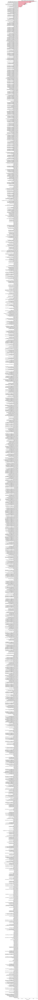

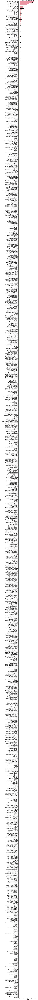

In [13]:
import seaborn as sns

def plot_importances(lgb_models):
    if hasattr(lgb_models[0], "feature_name_"):
        feature_names = lgb_models[0].feature_name_
    else:
        feature_names = lgb_models[0].feature_names_in_
    importances_mean = np.mean([mdl.feature_importances_ for mdl in lgb_models], axis=0)
    importances_std = np.std([mdl.feature_importances_ for mdl in lgb_models], axis=0)

    # DataFrameの作成
    importance_df = pd.DataFrame(
        {'feature': feature_names, 'importance_mean': importances_mean, 'importance_std': importances_std}
        )

    # 重要度の平均でソート
    importance_df = importance_df.sort_values(by='importance_mean', ascending=False)

    # 棒グラフの描画
    plt.figure(figsize=(7, len(importance_df) * 0.2))
    sns.barplot(x="importance_mean", y="feature", data=importance_df, xerr=importance_df["importance_std"])
    plt.xlabel('Importance')
    plt.ylabel('Features')
    plt.title('Feature importance with standard deviation')
    plt.show()
    return

plot_importances(seen_models)
plot_importances(unseen_models)

In [14]:
def predict_score(df, models, features):
    preds = []
    for model, feature in zip(models, features):
        ft_df = feature.transform(df)
        print("num_nan in feature", ft_df.isna().sum().sum())
        pred = np.clip(model.predict(ft_df), 1, 10)
        preds.append(pred)
    pred = np.mean(preds, axis=0)
    return pred
    
seen_pred = predict_score(ts_df, seen_models, seen_features)
unseen_pred = predict_score(ts_df, unseen_models, unseen_features)

num_nan in feature 0
num_nan in feature 0
num_nan in feature 0
num_nan in feature 0
num_nan in feature 0
num_nan in feature 0
num_nan in feature 0
num_nan in feature 0
num_nan in feature 0
num_nan in feature 0


In [15]:
tr_uniq_user = tr_df["user_id"].unique().tolist()
ts_df["is_seen_user"] = ts_df["user_id"].isin(tr_uniq_user)

ts_df["score"] = unseen_pred
ts_df["score"] = ts_df["score"].mask(ts_df["is_seen_user"], seen_pred)
ts_df["score"].to_csv("submission.csv", index=False, header=True)
ts_df

,user_id,anime_id,dataset_type,score,ground_truth,user_no,anime_no,anime_genres,anime_japanese_name,anime_type,...,anime_cluster_92,anime_cluster_93,anime_cluster_94,anime_cluster_95,anime_cluster_96,anime_cluster_97,anime_cluster_98,anime_cluster_99,anime_clustergroup,is_seen_user
0,0008e10fb39e55447333,04068820a73e52dc3b32,test,8.027753,NaN,0,26,"Action, Slice of Life, Comedy, Supernatural",モブサイコ100 II,TV,...,1.326143,1.165565,0.958602,1.060772,1.217442,1.199478,1.171370,1.366107,56,True
1,0008e10fb39e55447333,04a3d0b122b24965e909,test,8.809896,NaN,0,32,"Action, Comedy, Historical, Parody, Samurai, S...",銀魂,TV,...,1.325384,1.098228,1.071554,1.183658,1.164655,1.150186,1.128635,1.334429,78,True
2,0008e10fb39e55447333,1447fe1f10b59912d6a8,test,6.128084,NaN,0,149,"Military, Comedy, Historical, Drama, Fantasy, ...",劇場版 鋼の錬金術師 シャンバラを征く者,Movie,...,1.242894,0.993348,0.840793,1.145863,0.943475,1.125047,0.931155,1.317217,94,True
3,0008e10fb39e55447333,2622632598c68682afd5,test,8.566931,NaN,0,291,"Comedy, Sports, Drama, Shounen",はじめの一歩 Rising,TV,...,1.320337,1.199403,1.050893,1.200141,1.208022,0.857177,1.271220,1.342930,68,True
4,0008e10fb39e55447333,2701850c7216516fec46,test,2.650886,NaN,0,295,"Action, Game, Adventure, Romance, Fantasy",ソードアート・オンライン II,TV,...,1.192151,1.132177,0.911094,1.064354,1.156563,1.134062,1.223454,1.304784,33,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117671,ffe85a36cd20500faa58,f508b02efeac8ecb8cc0,test,8.417023,NaN,1997,1864,"Action, Sci-Fi, Dementia, Psychological, Drama...",新世紀エヴァンゲリオン,TV,...,1.265819,0.972584,0.831710,1.148707,0.820935,1.181126,1.055739,1.221030,90,False
117672,ffe85a36cd20500faa58,f5b8ecea3beea4b82d79,test,8.219281,NaN,1997,1866,"Action, Fantasy, Supernatural, Comedy, School,...",武装錬金,TV,...,1.215647,1.028431,1.008027,1.178822,1.018769,1.173577,1.117433,1.416564,62,False
117673,ffe85a36cd20500faa58,f6c208226b6b69948053,test,8.202952,NaN,1997,1871,"Action, Magic, Romance, Fantasy, Shounen",風のスティグマ,TV,...,1.073500,1.109646,1.007041,1.121903,1.085470,1.191505,1.063872,1.406408,62,False
117674,ffe85a36cd20500faa58,fe67592c312fc1e17745,test,7.881675,NaN,1997,1942,"Comedy, Drama, Ecchi, Harem, Magic, Romance, S...",まぶらほ,TV,...,1.185073,1.049291,1.084609,1.177762,1.071952,1.220172,1.132596,1.394005,80,False
